In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
import pandas as pd
from pathlib import Path
import gdown
import zipfile
import shutil
import plotly.express as px
import numpy as np
import os
from sklearn.model_selection import train_test_split

In [2]:
tf.__version__

'2.16.1'

In [3]:
# data = tfds.load('deep_weeds', data_dir='../data', download=False)

The 'built-in' data loading approach does not work because google drive has put a virus scan warning infront of the link, so the download will only download that page and not the actual dataset.

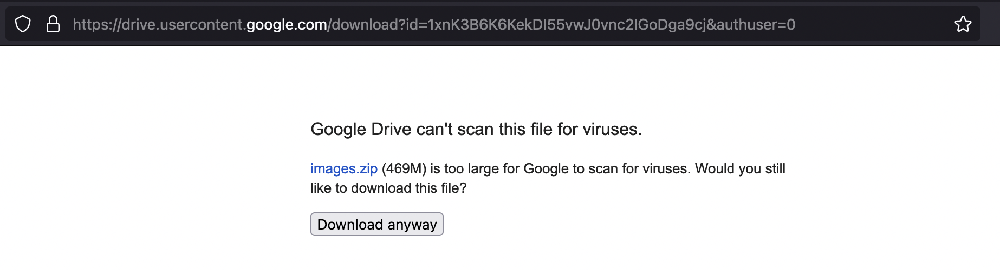

This is what actually downloads - 
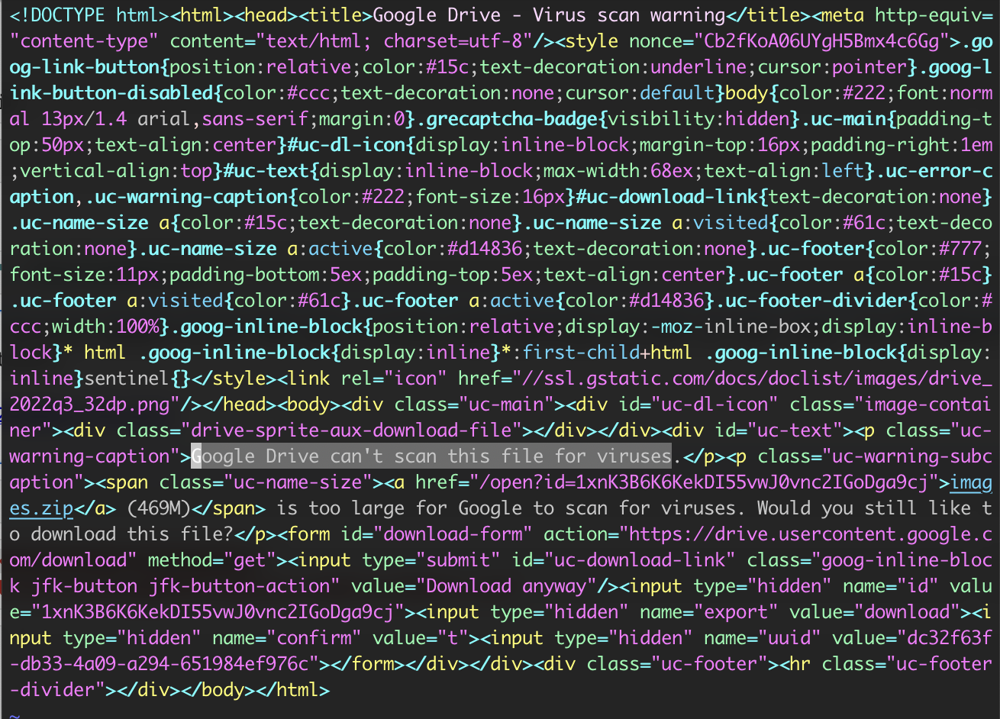

The workaround implemented here is to use the `gdown` library to download from google drive, and package the dataset with [tf.keras.preprocessing.image_dataset_from_directory()](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image_dataset_from_directory)

In [4]:
_URL = "https://drive.google.com/uc?id=1xnK3B6K6KekDI55vwJ0vnc2IGoDga9cj"
_URL_LABELS = "https://raw.githubusercontent.com/AlexOlsen/DeepWeeds/master/labels/labels.csv"

In [5]:
data_root = Path('../data/').absolute()
download_path = data_root / 'downloads'
images_download = download_path / 'images.zip'

images_path = data_root / 'images'
train_path = images_path / 'train'
test_path = images_path / 'test'

seed = 42

In [6]:
image_zip_path = gdown.cached_download(_URL, images_download, quiet=True)

In [7]:
image_zip_path

PosixPath('/Users/chris/repos/deepweeds-kerascv/notebooks/../data/downloads/images.zip')

In [8]:
labels_df = pd.read_csv(_URL_LABELS)
labels_df.head()

,Filename,Label,Species
0,20160928-140314-0.jpg,0,Chinee apple
1,20160928-140337-0.jpg,0,Chinee apple
2,20160928-140731-0.jpg,0,Chinee apple
3,20160928-140747-0.jpg,0,Chinee apple
4,20160928-141107-0.jpg,0,Chinee apple


In [9]:
# Create a test split
train_df, test_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df.Label, random_state=seed)
train_df['split'] = 'train'
train_df['base_path'] = train_path
test_df['split'] = 'test'
test_df['base_path'] = test_path
labels_df = pd.concat([train_df, test_df])

# Figure out the directories to save each image in following the 
# tf.keras.preprocessing.image_dataset_from_directory expected format
labels_df['species'] = labels_df.Species.str.replace(' ', '_').str.lower()
labels_df['label_path'] = ''

for label in labels_df['species'].unique():
    for split_path in (train_path, test_path):
        label_path = split_path / label
        shutil.rmtree(label_path, ignore_errors=True)
        label_path.mkdir(parents=True)
        labels_df.loc[(labels_df.species == label) & (labels_df.base_path == split_path), 'label_path'] = label_path


labels_df['file_path'] = labels_df.label_path / labels_df.Filename
labels_df.head()

,Filename,Label,Species,split,base_path,species,label_path,file_path
15819,20180125-093902-2.jpg,8,Negative,train,/Users/chris/repos/deepweeds-kerascv/notebooks...,negative,/Users/chris/repos/deepweeds-kerascv/notebooks...,/Users/chris/repos/deepweeds-kerascv/notebooks...
6891,20171102-122911-2.jpg,2,Parkinsonia,train,/Users/chris/repos/deepweeds-kerascv/notebooks...,parkinsonia,/Users/chris/repos/deepweeds-kerascv/notebooks...,/Users/chris/repos/deepweeds-kerascv/notebooks...
10793,20171219-114106-2.jpg,8,Negative,train,/Users/chris/repos/deepweeds-kerascv/notebooks...,negative,/Users/chris/repos/deepweeds-kerascv/notebooks...,/Users/chris/repos/deepweeds-kerascv/notebooks...
4593,20170906-105922-1.jpg,3,Parthenium,train,/Users/chris/repos/deepweeds-kerascv/notebooks...,parthenium,/Users/chris/repos/deepweeds-kerascv/notebooks...,/Users/chris/repos/deepweeds-kerascv/notebooks...
10119,20171218-120753-2.jpg,8,Negative,train,/Users/chris/repos/deepweeds-kerascv/notebooks...,negative,/Users/chris/repos/deepweeds-kerascv/notebooks...,/Users/chris/repos/deepweeds-kerascv/notebooks...


In [10]:
path_matches_label = labels_df.apply(lambda row: row.file_path.parent.name == row.species, axis=1)
assert path_matches_label.all(), "Somehow we've messed up saving some images in their proper label directory"

In [11]:
labels_df.file_path.iloc[0]

PosixPath('/Users/chris/repos/deepweeds-kerascv/notebooks/../data/images/train/negative/20180125-093902-2.jpg')

In [12]:
# Extract each image to the correct train / test label folder
with zipfile.ZipFile(image_zip_path, 'r') as image_zip:
    files = image_zip.namelist()
    labelled_files = labels_df.Filename
    for file in labelled_files:
        assert file in files

    extract_img = lambda row: image_zip.extract(row.Filename, row.file_path)
    labels_df.apply(extract_img, axis=1)

shutil.rmtree(download_path)

In [13]:
labels_df.species.unique().tolist()

['negative',
 'parkinsonia',
 'parthenium',
 'rubber_vine',
 'lantana',
 'prickly_acacia',
 'snake_weed',
 'chinee_apple',
 'siam_weed']

## Loading the dataset
After running all the above, this snippet will be all is needed to load a train / validation split

In [14]:
def get_train_val_dataloader(batch_size: int = None, val_split = 0.1, verbose=False):
    class_names = [
        'rubber_vine',
        'negative',
        'parthenium',
        'chinee_apple',
        'prickly_acacia',
        'snake_weed',
        'parkinsonia',
        'siam_weed',
        'lantana',
    ]
    
    train_data, val_data = tf.keras.preprocessing.image_dataset_from_directory(
        train_path, 
        class_names=class_names,
        image_size=(256,256),
        validation_split=val_split, # Makes the split at the last N% of files, so with shuffling is just a random split
        subset='both', # Loads validation and train splits
        batch_size=batch_size,
        seed=seed,
        shuffle=True,
        verbose=verbose
    )

    return train_data, val_data

train_data, val_data = get_train_val_dataloader(verbose=True)

Found 14007 files belonging to 9 classes.
Using 12607 files for training.
Using 1400 files for validation.


2024-06-28 13:37:16.391779: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2024-06-28 13:37:16.391803: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-06-28 13:37:16.391808: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-06-28 13:37:16.391827: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-06-28 13:37:16.391836: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


## EDA

In [15]:
class_names = [
    'rubber_vine',
    'negative',
    'parthenium',
    'chinee_apple',
    'prickly_acacia',
    'snake_weed',
    'parkinsonia',
    'siam_weed',
    'lantana',
]

In [16]:
val_counts = [0]*len(class_names)
counts_df = pd.DataFrame({"class": class_names})
for split, dataset in (['validation', val_data], ['train', train_data]):
    counts = [0]*len(class_names)

    for X,y in dataset:
        counts[y] += 1
        
    total = sum(counts)
    for i,_ in enumerate(counts):
        counts[i] = counts[i] / total

    counts_df[split] = counts

2024-06-28 13:37:16.632167: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2024-06-28 13:37:18.423050: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [17]:
fig = px.bar(counts_df, x='class', y=['validation','train'], barmode='group', title='Class proportions')
fig.update_layout(
    yaxis_title='proportion',
    legend_title='Data split',
)
fig.show()

Using 12607 files for training.
Using 1400 files for validation.


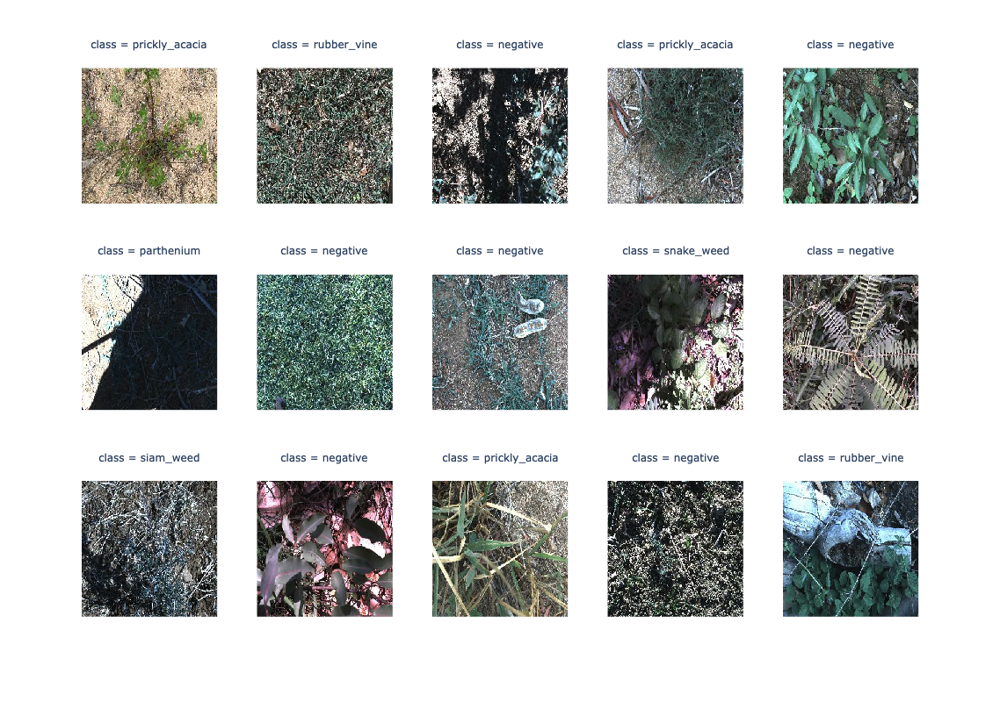

In [18]:
batch_size = 15
train_data, _ = get_train_val_dataloader(batch_size=batch_size)

X, y = next(iter(train_data))
fig = px.imshow(X.numpy(), facet_col=0, facet_col_wrap = 5,
               height=800, width=1000)
fig.update_layout(
    
)
for i, class_idx in enumerate(y.numpy()):
    fig.layout[f'xaxis{"" if i == 0 else i}']['showticklabels']=False
    fig.layout[f'yaxis{"" if i == 0 else i}']['showticklabels']=False

    fig.layout.annotations[i]['text'] = 'class = %s' % class_names[class_idx]
fig.show()